# Lesson Functions

In [276]:
#Lesson functions for Project 5 - Vehicle Detection
import os
import numpy as np
import cv2
from cv2 import HOGDescriptor
import time
from fnmatch import fnmatch
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import multiprocessing
from scipy.ndimage.measurements import label
%matplotlib inline

# Define a function to extract a list of images
def build_car_notcar_lists(car_directory='vehicles', notcar_directory='non-vehicles'):
    cars = []
    notcars = []
    for path, subdirs, files in os.walk(car_directory):
        for name in files:
            if fnmatch(name, '*.png'):
                filename = os.path.join(path, name)
                cars.append(filename)
        
    for path, subdirs, files in os.walk(notcar_directory):
        for name in files:
            if fnmatch(name, '*.png'):
                filename = os.path.join(path, name)
                notcars.append(filename)
    return cars, notcars

# Construct a dictionary out of car images and not car images
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        
        return features

def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel()
    # Return the features vector
    return features
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist() and get_hog_features
def extract_features(imgs, color_space='RGB', spatial_size=(16, 16),
                        hist_bins=16, orient=9,
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else:
            feature_image = np.copy(image)

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list


def HOGProcess(hsv):
    orient = 11
    pix_per_cell = 16 #16
    cell_per_block = 2
    return get_hog_features(hsv, orient, pix_per_cell, cell_per_block, feature_vec=False)

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    bboxes = []
    
    img = img.astype(np.float32)/255
    #img[:,:500,:] = 0 # Experimenting with clearing the sides of the image so as to avoid searching there. Not used.

    
    for search in searches:
        ystart = search[0]
        ystop = search[1]
        scale = search[2]
        
        img_tosearch = img[ystart:ystop,:,:]
        ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
  
        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
 #       channel_list = [ctrans_tosearch[:,:,0], ctrans_tosearch[:,:,1], ctrans_tosearch[:,:,2]]
        
        # Define blocks and steps as above
        nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
        nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
        nfeat_per_block = orient*cell_per_block**2

        # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
        window = 64
        nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
        cells_per_step = 2  # Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step 
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step

        # Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

#        hog1, hog2, hog3 = p.map(HOGProcess, channel_list)

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

                xleft = xpos*pix_per_cell #+ (window*scale)/2
                ytop = ypos*pix_per_cell

                # Extract the image patch
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                # Get color features
                spatial_features = bin_spatial(subimg, size=spatial_size)
                hist_features = color_hist(subimg, nbins=hist_bins)

                # Scale features and make a prediction
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
                test_prediction = svc.predict(test_features)

                if test_prediction == 1:
                #if True:
                    xbox_left = np.int(xleft*scale)
                    ytop_draw = np.int(ytop*scale)
                    win_draw = np.int(window*scale)
                    bboxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                    #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 

    return bboxes

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    for box in bbox_list:
        if np.max(heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]]) > 1:
            heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 2

    # Return updated heatmap
    return heatmap

def add_heat_old(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def remove_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Remove 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] -= 1

    # Return updated heatmap
    return heatmap
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

Cars has 8792 images for training. Not-Cars has 8968 images for training.


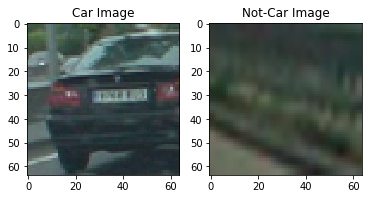

In [185]:
#8968 notcar images
#8792 car images
# Pipeline for Classifier
cars, notcars = build_car_notcar_lists()
print('Cars has', len(cars), 'images for training. Not-Cars has', len(notcars), 'images for training.' )

#Generate writeup images
ind = np.random.randint(0, len(cars))
car_image = mpimg.imread(cars[ind])

ind = np.random.randint(0, len(notcars))
notcar_image = mpimg.imread(notcars[ind])

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Not-Car Image')

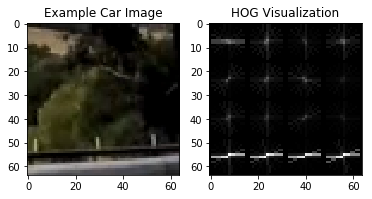

In [269]:
#Hog Exploration
# Generate a random index to look at a car image
ind = np.random.randint(0, len(notcars))
ind = 4087
# Read in the image
image = mpimg.imread(notcars[ind])
gray = image[:,:,0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Define HOG parameters
colorspace = 'YUV'
orient = 11
pix_per_cell = 16 #16
cell_per_block = 2
hog_channel = "ALL"
# Call our function with vis=True to see an image output
hog_features, hog_image = get_hog_features(gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')


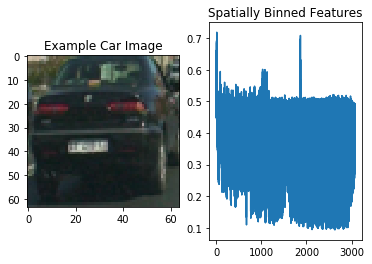

In [229]:
#Exploration of spatial binning
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])

feature_vec = bin_spatial(image, color_space=colorspace, size=(32, 32))
# Plot features
fig = plt.figure()
plt.subplot(121)
plt.imshow(image)
plt.title('Example Car Image')
plt.subplot(122)
plt.plot(feature_vec)
plt.title('Spatially Binned Features')


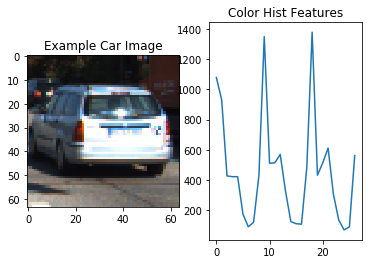

In [13]:
#Exploration of color histogram binning
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])
hist_bins=9
feature_vec = color_hist(image, nbins=hist_bins)
# Plot features
fig = plt.figure()
plt.subplot(121)
plt.imshow(image)
plt.title('Example Car Image')
plt.subplot(122)
plt.plot(feature_vec)
plt.title('Color Hist Features')

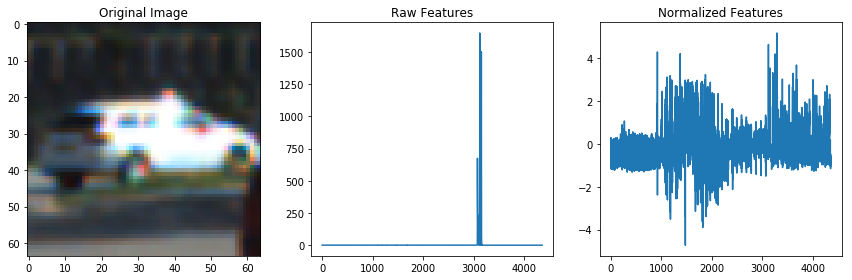

In [145]:
#Combine feature sets and test with subset of data
# Reduce the sample size because HOG features are slow to compute
sample_size = 500
cars_small = cars[0:sample_size]
notcars_small = notcars[0:sample_size]

### Core parameters reiterated here
colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient =11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
hist_bins = 32
spatial_size=(32, 32)

t=time.time()
car_features = extract_features(cars_small, color_space=colorspace, orient=orient, spatial_size=spatial_size,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, hist_bins=hist_bins)
notcar_features = extract_features(notcars_small, color_space=colorspace, orient=orient, spatial_size=spatial_size,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel,hist_bins=hist_bins)
if len(car_features) > 0:
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    car_ind = np.random.randint(0, len(cars_small))
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars_small[car_ind]))
    plt.title('Original Image')
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    fig.tight_layout()
else: 
    print('Your function only returns empty feature vectors...')

# Classifier Training

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC

t=time.time()
car_features = extract_features(cars, color_space=colorspace, orient=orient, spatial_size=spatial_size,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, hist_bins=hist_bins)
notcar_features = extract_features(notcars, color_space=colorspace, orient=orient, spatial_size=spatial_size,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel,hist_bins=hist_bins)

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Feature vector length: 4356
12.09 Seconds to train SVC...
Test Accuracy of SVC =  0.9941
My SVC predicts:  [ 1.  0.  1.  0.  0.  1.  1.  0.  1.  0.]
For these 10 labels:  [ 1.  0.  1.  0.  0.  1.  1.  0.  1.  0.]
0.01797 Seconds to predict 10 labels with SVC


# Strip Searching

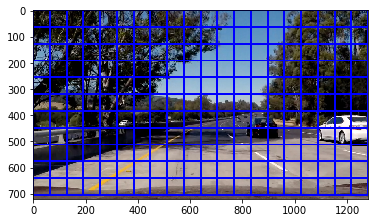

In [273]:
#Test of window drawing functionality
image = mpimg.imread('./test_images/test5.jpg')
windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
                       
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)

(720, 1280, 3)


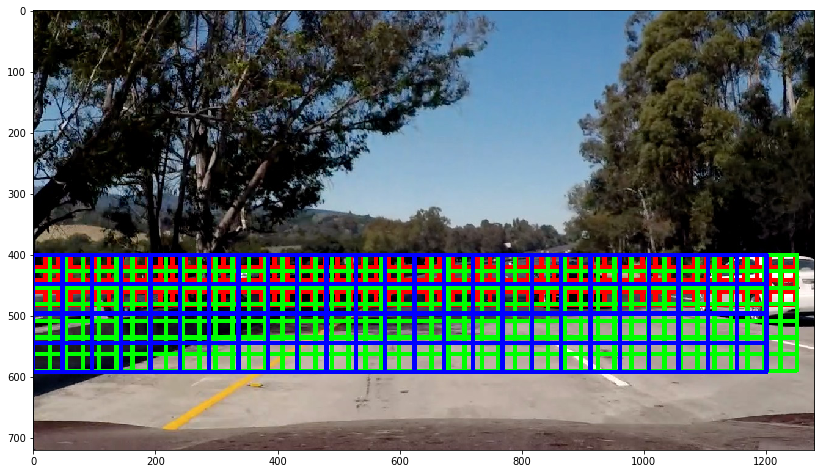

In [274]:
# Find cars in different colors
#scale 1 = 64
#find_cars(img, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
searches1 = ((400,520,0.65),)

bboxes1 = find_cars(image, searches1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

searches2 = ((400, 640, 0.85),)
bboxes2 = find_cars(image, searches2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

searches3 = ((400, 640, 1.5),)
bboxes3 = find_cars(image, searches3, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

window_img = draw_boxes(image, bboxes1, color=(255, 0, 0), thick=6)                    
window_img = draw_boxes(window_img, bboxes2, color=(0, 255, 0), thick=6)      
window_img = draw_boxes(window_img, bboxes3, color=(0, 0, 255), thick=6)     

fig, ax = plt.subplots(figsize=(14, 16))
ax.imshow(window_img)
print(window_img.shape)
#plt.imshow(window_img)

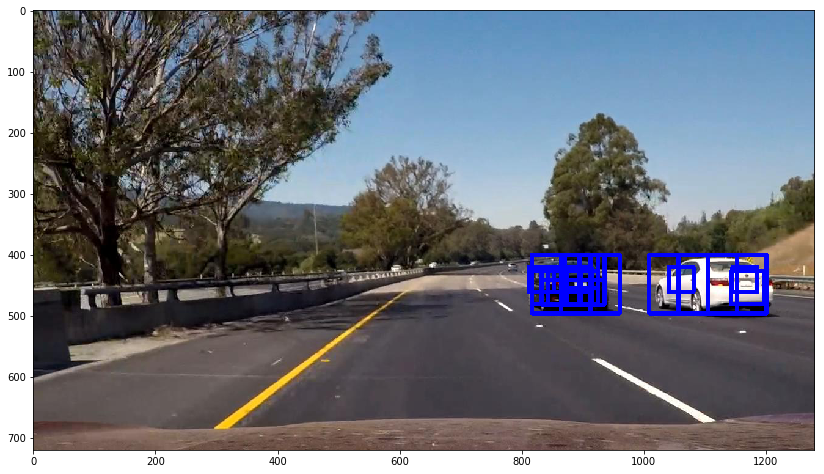

In [216]:
#searches = ((400, 520, 0.5), (400, 520, 1), (400, 640, 1.5), (400, 720, 2))
searches = ((400, 520, .65), (400, 640, .85), (400, 640, 1.5))

bboxes = find_cars(image, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

window_img = draw_boxes(image, bboxes, color=(0, 0, 255), thick=6)
fig, ax = plt.subplots(figsize=(14, 16))
ax.imshow(window_img)

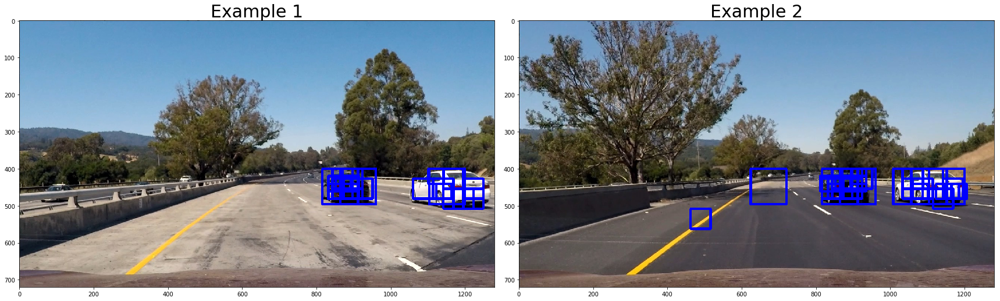

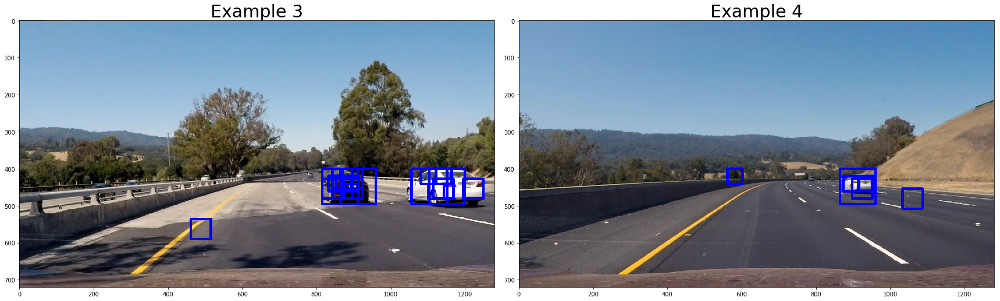

In [277]:
image1 = mpimg.imread('./test_images/test1.jpg')
image2 = mpimg.imread('./test_images/test6.jpg')
image3 = mpimg.imread('./test_images/test4.jpg')
image4 = mpimg.imread('./test_images/test3.jpg')

bboxes = find_cars(image1, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
window_img1 = draw_boxes(image1, bboxes, color=(0, 0, 255), thick=6)
bboxes = find_cars(image2, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
window_img2 = draw_boxes(image2, bboxes, color=(0, 0, 255), thick=6)
bboxes = find_cars(image3, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
window_img3 = draw_boxes(image3, bboxes, color=(0, 0, 255), thick=6)
bboxes = find_cars(image4, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
window_img4 = draw_boxes(image4, bboxes, color=(0, 0, 255), thick=6)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(window_img1)
ax1.set_title('Example 1', fontsize=30)
ax2.imshow(window_img2)
ax2.set_title('Example 2', fontsize=30)
f2, (ax3, ax4) = plt.subplots(1, 2, figsize=(24, 9))
f2.tight_layout()
ax3.imshow(window_img3)
ax3.set_title('Example 3', fontsize=30)
ax4.imshow(window_img4)
ax4.set_title('Example 4', fontsize=30)

# Heat map work

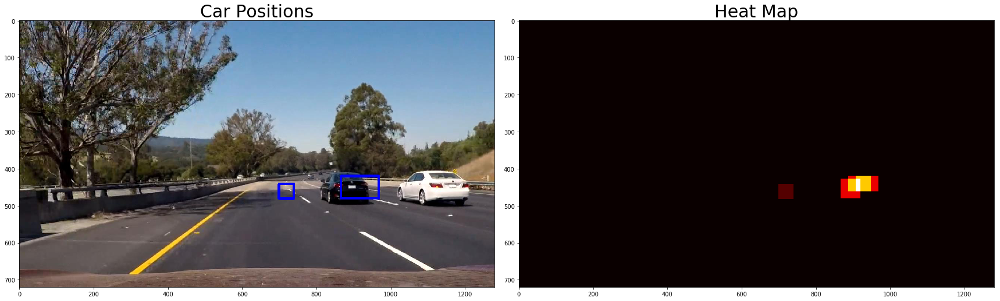

In [191]:
# Read in image similar to one shown above 
heat = np.zeros_like(image[:,:,0]).astype(np.float)

# Add heat to each box in box list
heat = add_heat(heat,bboxes)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,0)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(draw_img)
ax1.set_title('Car Positions', fontsize=30)
ax2.imshow(heatmap, cmap='hot')
ax2.set_title('Heat Map', fontsize=30)



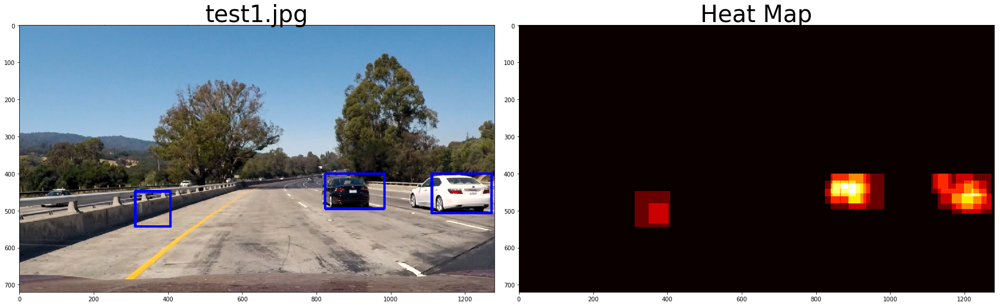

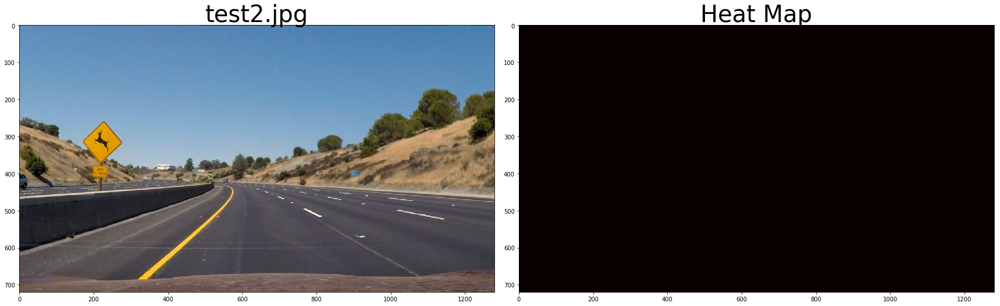

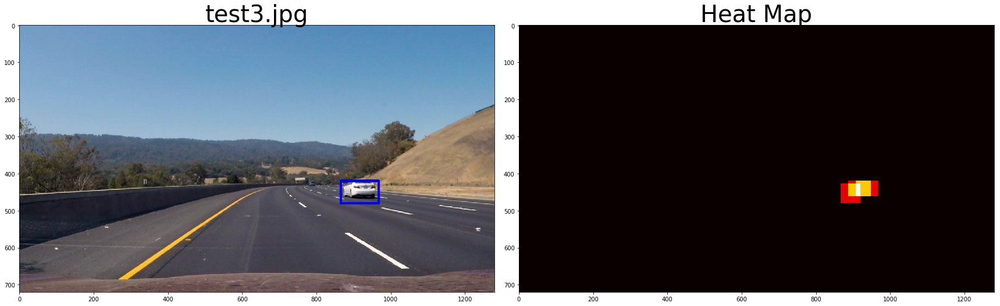

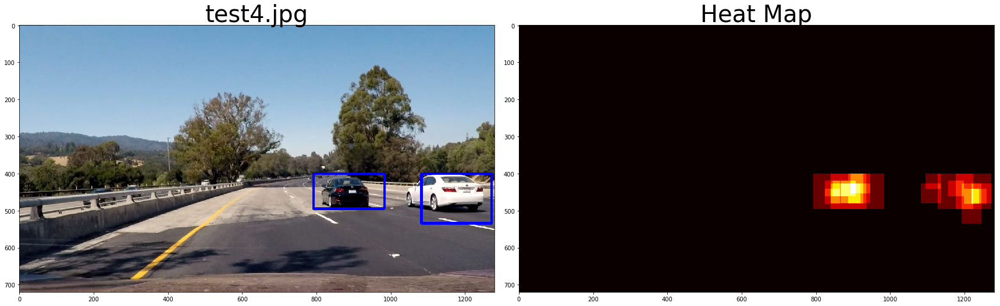

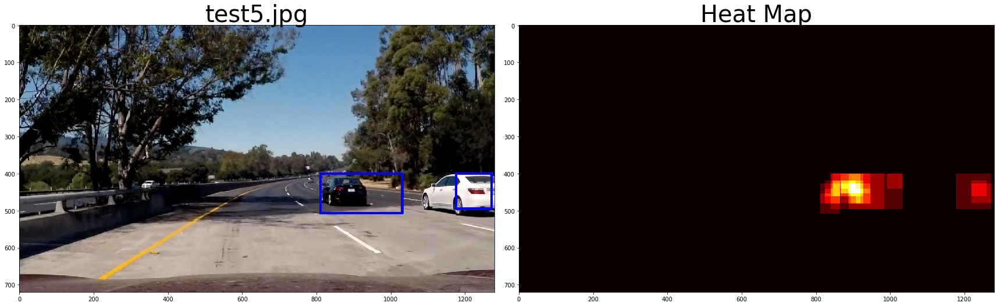

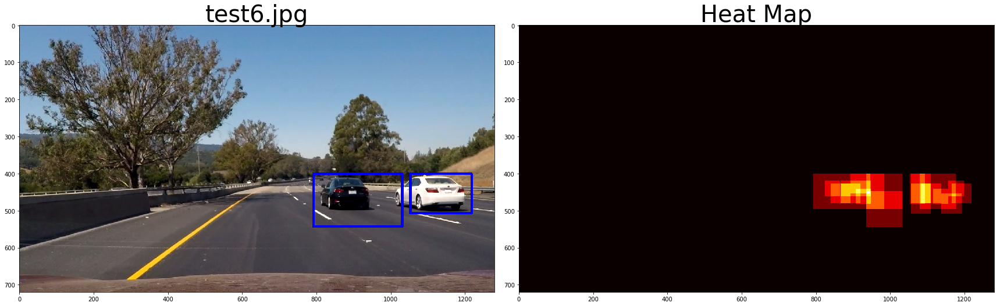

In [192]:
# Test on images
heat_threshold = 2

for filename in os.listdir('test_images'):
    if fnmatch(filename, '*.jpg'):
        image = mpimg.imread('test_images/' + filename)

        bboxes = find_cars(image, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat,bboxes)
        heat = apply_threshold(heat,heat_threshold)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        draw_img = draw_labeled_bboxes(np.copy(image), labels)

        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(draw_img)
        ax1.set_title(filename, fontsize=40)

        ax2.imshow(heatmap, cmap='hot')
        ax2.set_title('Heat Map', fontsize=40)

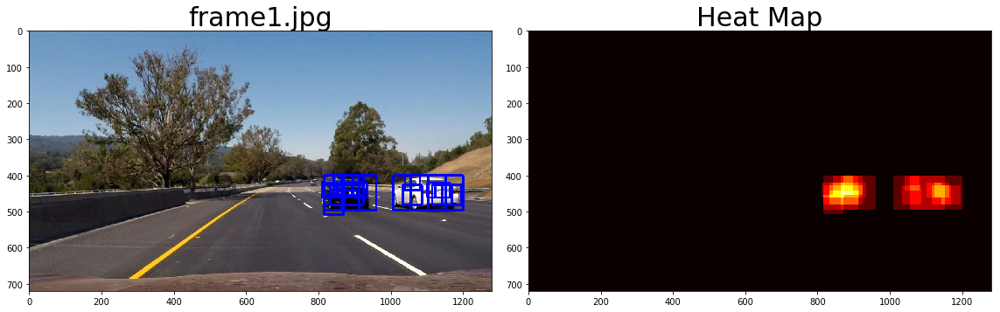

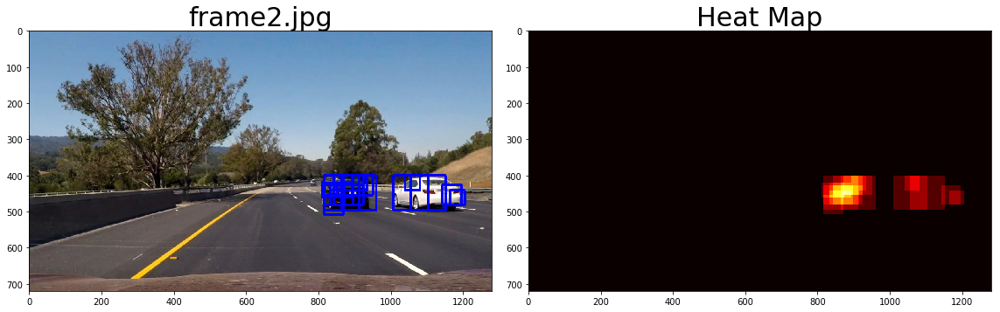

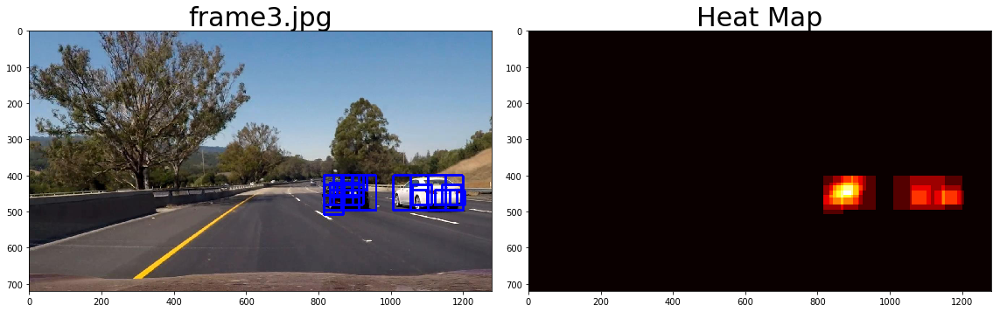

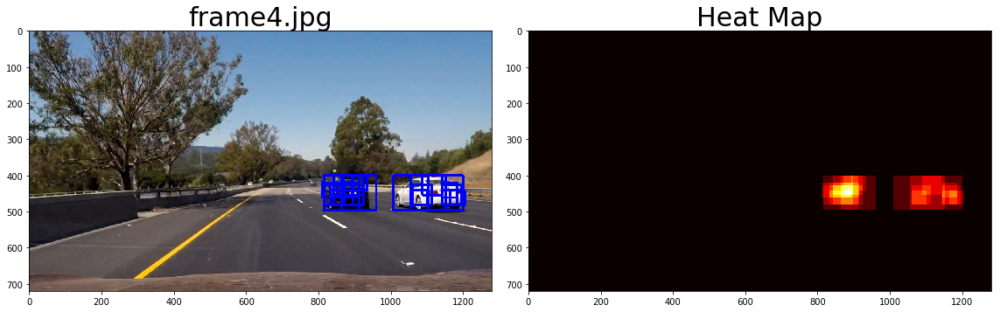

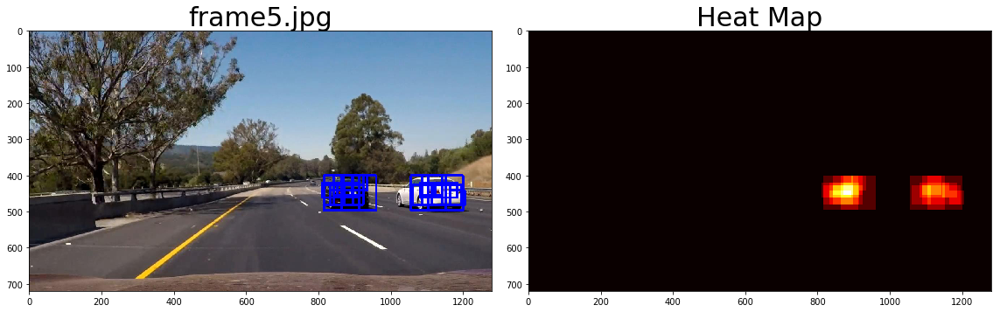

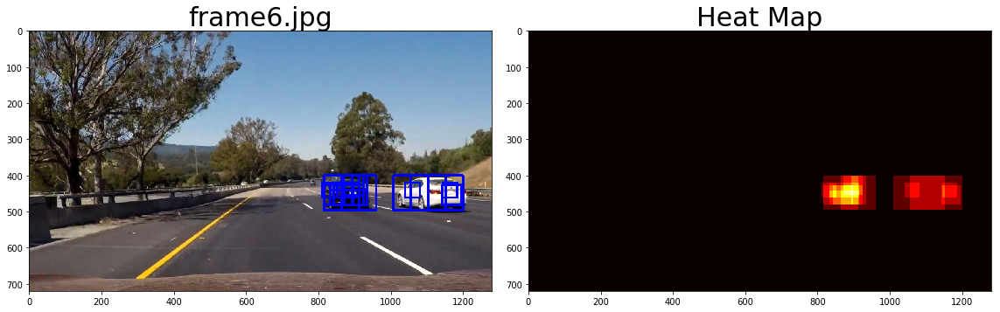

In [218]:
# Test on frames
heat_threshold = 0
from collections import deque
heats = deque(maxlen=6)

for filename in os.listdir('frames'):
    if fnmatch(filename, '*.jpg'):
        image = mpimg.imread('frames/' + filename)

        bboxes = find_cars(image, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        draw_img = draw_boxes(image, bboxes, color=(0, 0, 255), thick=6)
        
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat,bboxes)
        heats.append(np.copy(heat))
        
        heat = apply_threshold(heat,heat_threshold)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
               
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
        f.tight_layout()

        ax1.imshow(draw_img)
        ax1.set_title(filename, fontsize=30)

        ax2.imshow(heatmap, cmap='hot')
        ax2.set_title('Heat Map', fontsize=30)
        

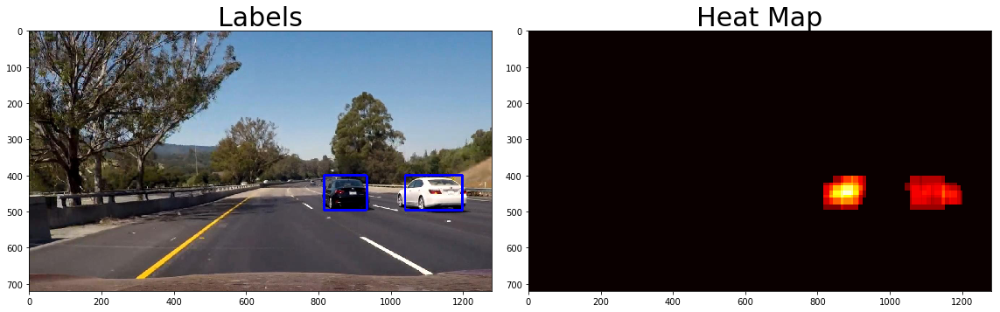

In [219]:
heat_sum = sum(heats)
heat_sum = apply_threshold(heat_sum,21)
heatmap_sum = np.clip(heat_sum, 0, 255)
labels = label(heatmap_sum)
image = mpimg.imread('frames/frame6.jpg')
draw_img = draw_labeled_bboxes(np.copy(image), labels)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
f.tight_layout()

ax1.imshow(draw_img)
ax1.set_title('Labels', fontsize=30)

ax2.imshow(heatmap_sum, cmap='hot')
ax2.set_title('Heat Map', fontsize=30)

# Video processing

In [220]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque

class MyVideoProcessor(object):

    def __init__(self):
        self.heat = None
        self.heat_threshold = 17 #17

        self.heat_deque = deque(maxlen=10)
        
    def pipeline(self, image):       
        # Vehicle detection pipeline
        if (self.heat is None):
            self.heat = np.zeros_like(image[:,:,0]).astype(np.float)
                
        # Calculate and add the new one
        bboxes = find_cars(image, searches, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, bboxes)
        self.heat_deque.append(heat)
        heatmap_sum = sum(self.heat_deque)
        
        heat = apply_threshold(heatmap_sum, self.heat_threshold)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        draw_img = draw_labeled_bboxes(np.copy(image), labels)    
        return draw_img
    


In [221]:
# Here we test the first video
my_video_processor = MyVideoProcessor()

vehicle_output = 'output_images/test_video.mp4'
clip1 = VideoFileClip("test_video.mp4")
vehicle_clip = clip1.fl_image(my_video_processor.pipeline) 
%time vehicle_clip.write_videofile(vehicle_output, audio=False)

[MoviePy] >>>> Building video output_images/test_video.mp4
[MoviePy] Writing video output_images/test_video.mp4


 97%|█████████████████████████████████████████████████████████████▍ | 38/39 [00:44<00:01,  1.17s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/test_video.mp4 

Wall time: 45.6 s


In [222]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vehicle_output))

## Full Project Video

In [223]:
# Here we test the second video
my_video_processor = MyVideoProcessor()
vehicle_output2 = 'output_images/project_video.mp4'
clip2 = VideoFileClip("project_video.mp4")
vehicle_clip2 = clip2.fl_image(my_video_processor.pipeline) 
%time vehicle_clip2.write_videofile(vehicle_output2, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|██████████████████████████████████████████████████████████▉| 1260/1261 [24:40<00:01,  1.16s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

Wall time: 24min 41s


In [225]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vehicle_output2))

# Output some frames of video for report writing

In [32]:
# Here we convert the first video to frames
clip1 = VideoFileClip("test_video.mp4")
clip1.save_frame("frames/frame1.jpg")
clip1.save_frame("frames/frame2.jpg", t=0.1)
clip1.save_frame("frames/frame3.jpg", t=0.2)
clip1.save_frame("frames/frame4.jpg", t=0.3)
clip1.save_frame("frames/frame5.jpg", t=0.4)
clip1.save_frame("frames/frame6.jpg", t=0.5)


# Code from previous exercise follows - this was used to generate the combined video with lanes and vehicles

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

#CarND-Advanced Lane Lines
# Initial functions used throughout project. 

# Edit this function to create your own pipeline.
def apply_thresholds(img, s_thresh=(170, 255), sx_thresh=(20, 100), l_thresh=(100, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    sl_binary = np.zeros_like(s_channel)
    sl_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sl_binary))
    return color_binary

def combine_channels(img):
    channel1 = img[:,:,1]
    channel2 = img[:,:,2]
    combined = np.zeros_like(channel1)
    combined[(channel1 == 1) | (channel2 == 1)] = 1
    return combined

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, 1)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [ ]:
# Computing the camera calibration matrix and distortion coefficients given a set of chessboard images
# Code in this cell derived from CarND-Camera-Calibration project in course examples
# https://github.com/udacity/CarND-Camera-Calibration

import glob
chess_x = 9
chess_y = 6
draw_outputs = False

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chess_y*chess_x,3), np.float32)
objp[:,:2] = np.mgrid[0:chess_x, 0:chess_y].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (chess_x,chess_y), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        if draw_outputs == True:
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (chess_x,chess_y), corners, ret)
            #write_name = 'camera_cal/output/corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
            cv2.waitKey(500)

cv2.destroyAllWindows()


# Apply a distortion correction to raw images.
# Use color transforms, gradients, etc., to create a thresholded binary image.
# Apply a perspective transform to rectify binary image ("birds-eye view").


In [ ]:
# Test undistortion on a checkboard image

import pickle
%matplotlib inline

img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undist_calibration1.jpg',dst)

#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [ ]:
# Testing distortion on test image
%matplotlib inline

img = cv2.imread('test_images/test6.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/undist_test6.jpg',dst)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)


In [ ]:

# Step through the list and apply our pipeline function. 
# This cell is for trying out different thresholds
import os
s_thresh=(170, 255) 
sx_thresh=(80, 100)
l_thresh=(120, 255)
transformed = []
undist_images = []
for filename in os.listdir('test_images'):

    image = mpimg.imread('test_images/' + filename)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    undist_images.append(np.copy(undist))
    result = apply_thresholds(undist, s_thresh, sx_thresh, l_thresh)
    combined = combine_channels(result)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Apply Threshold Result', fontsize=40)
    
    ax3.imshow(combined, cmap='gray')
    ax3.set_title('Combined Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
       
    transformed.append(combined)
    

In [ ]:
# Perspective transform and mask

image = transformed[0]
vert_images = []

def src_dst_matrices(image):
    img_size = (image.shape[1], image.shape[0])
    src = np.float32(
        [[(img_size[0] / 2) - 50, img_size[1] / 2 + 90],
        [((img_size[0] / 6) - 20), img_size[1] -20],
        [(img_size[0] * 5 / 6) + 65, img_size[1] -20],
        [(img_size[0] / 2 + 50), img_size[1] / 2 + 90]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
      
    print('Source')
    print(src)
    print('Dest')
    print(dst)
    return src, dst

def warper(image, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    result = cv2.warpPerspective(image, M, img_size)
    return result

src, dst = src_dst_matrices(image)

# Generates the vertices array used for a region of interest on the warped perspective image
def get_vertices(image):
    img_size = (image.shape[1], image.shape[0])
    y_max = img_size[1]
    x_max = img_size[0]
    # Create a rough "pq" shape on the image as a region of interest
    vertices = np.array(
        [[((int)(x_max * 0.85), (int)(y_max * 0.02)),
         ((int)(x_max * 0.85), (int)(y_max * 0.99)),
         ((int)(x_max * 0.65), (int)(y_max * 0.99)),
         ((int)(x_max * 0.50), (int)(y_max * 0.10)),
         ((int)(x_max * 0.35), (int)(y_max * 0.99)),
         ((int)(x_max * 0.15), (int)(y_max * 0.99)),
         ((int)(x_max * 0.15), (int)(y_max * 0.02))]], dtype=np.int32)

    print('Vertices')
    print(vertices)
    return vertices

vertices = get_vertices(image)

# Testing on original images.
#for filename in os.listdir('test_images'):
#    image = mpimg.imread('test_images/' + filename)
#    image = np.copy(image)
#    cv2.polylines(image, np.int32([src]),3, 255)
#    result = warper(image, src, dst)
#    cv2.polylines(result, np.int32([dst]),3, 255)

    # Plot the result
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#    f.tight_layout()
#    ax1.imshow(image)
#    ax1.set_title('Original Image', fontsize=40)

#    ax2.imshow(result, cmap='gray')
#    ax2.set_title('Perspective Result', fontsize=40)
    
# Real images
for image in transformed:  
    result = warper(image, src, dst)
    result = region_of_interest(result, vertices) 
    #cv2.polylines(result, np.int32([vertices]),3, 255)
    vert_images.append(result)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Perspective Result', fontsize=40)
    

In [ ]:
def full_pipeline(image, draw_extra=False):
    
    # Undistort the image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    # Apply color thresholds
    result = apply_thresholds(undist, s_thresh, sx_thresh, l_thresh)
    # Combine them
    combined = combine_channels(result)
    # Perspective warp
    warped = warper(combined, src, dst)
    # ROI filter on warped image
    roi = region_of_interest(warped, vertices) 
    # Histogram to find lanes, draw on image
    return add_histo(roi, undist, draw_extra)

def add_histo(binary_warped, undist, draw_extra=False):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    #if (draw_extra):
    #plt.plot(histogram)
    #plt.show()

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print('Left', leftx_base, ' Right', rightx_base )

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 120
    # Set minimum number of pixels found to recenter window
    minpix = 20
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit = np.polyfit(lefty, leftx, 2)
    new_leftx = leftx[0]
    right_fit = np.polyfit(righty, rightx, 2)
    new_rightx = rightx[0]
    
    # Sanity checks - width
    width_limit_in_px = 100
    width_in_px = new_rightx - new_leftx
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curverad = int(left_curverad + right_curverad / 2)

   
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    width_in_m = binary_warped.shape[1] * xm_per_pix / 2
    lane_centre = (new_leftx + new_rightx) * xm_per_pix / 2 - width_in_m
    centre_text = 'Vehicle is '
    if (lane_centre >= 0):
        centre_text = centre_text + '{0:.2f}m right of center'.format(lane_centre)
    else:
        centre_text = centre_text + '{0:.2f}m left of center'.format(abs(lane_centre))
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    Minv = cv2.getPerspectiveTransform(dst,src)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image, showing extra processing data if desired
    if (draw_extra):
        cv2.fillPoly(color_warp, np.int_([pts]), (0,50, 0))
        color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 0.3, newwarp, 0.8, 0)
        result = cv2.addWeighted(result, 0.7, color_warp, 1, 0)
    else:
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
        
    #Lines to draw image seen in writeup
    #color_warp = np.dstack((binary_warped, binary_warped, binary_warped)).astype(np.uint8)*255
    #color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #cv2.polylines(color_warp,pts_left.astype(np.int32),0,(255,255,0),3)
    #cv2.polylines(color_warp,pts_right.astype(np.int32),0,(255,255,0),3)
    #result = color_warp #cv2.addWeighted(warp_result, 1, color_warp, 1, 0)
    
    # Write some Text
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    curve_text = 'Radius of Curvature = {0:.0f}(m)'.format(avg_curverad)
    cv2.putText(result,curve_text,(10,30), font, 1,(255,255,255),2)
    cv2.putText(result,centre_text,(10,60), font, 1,(255,255,255),2)
    return result


class MyVideoProcessor(object):

    def __init__(self):
        self.draw_extra = False
        
    def pipeline(self, image):
        # your lane detection pipeline
        result = full_pipeline(image, self.draw_extra)     
        return result
    

In [ ]:
# Testing the pipeline on files
my_file_processor = MyVideoProcessor()
s_thresh=(100, 255)
sx_thresh=(40, 255)
l_thresh=(100, 255)

for filename in os.listdir('test_images'):
    image = mpimg.imread('test_images/' + filename)
    my_file_processor.draw_extra = False
    result = my_file_processor.pipeline(image)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Lanes Result', fontsize=40)
    
    #dst2 = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    #cv2.imwrite('output_images/lanes/' + filename, dst2)

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [ ]:
my_video_processor = MyVideoProcessor()

# Here we test the first video
lanes_output = 'output_images/project_video_output_lanes.mp4'
clip1 = VideoFileClip("output_images/project_video_output.mp4")
lanes_clip = clip1.fl_image(my_video_processor.pipeline) #NOTE: this function expects color images!!
%time lanes_clip.write_videofile(lanes_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(lanes_output))